# AA3 · Examen del Primer Parcial · Técnica 2: Detección de objetos
## Detección de casco de seguridad en trabajadores con YOLOv8

**Aprendizaje Automático III (IN1042) · Grupo A7 · Otoño 2026**
Autor: Rodrigo Rosales Díaz

**Problema:** en obras y plantas industriales el uso de casco es obligatorio, pero su supervisión es visual y no cubre todo el tiempo ni todas las áreas. El detector localiza en una imagen cada **cabeza con casco**, cada **cabeza sin casco** y a las **personas**, de modo que se pueda emitir una alerta cuando alguien no lo trae puesto.

**Estrategia:** mismo flujo de la Práctica 2 (fine-tuning de YOLO con `ultralytics`): elegir el modelo, obtener el dataset, organizarlo en formato YOLO (`images/`, `labels/`, `data.yaml`), auditar las etiquetas, entrenar en GPU, interpretar métricas (Precision, Recall, mAP50, mAP50-95) y hacer inferencia sobre el conjunto de prueba.

## 1. Configuración e hiperparámetros

In [1]:
import os, random, shutil, xml.etree.ElementTree as ET
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import torch
from sklearn.model_selection import train_test_split
import ultralytics
from ultralytics import YOLO

SEED = 42
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)
device = "0" if torch.cuda.is_available() else "cpu"
print(f"Dispositivo asignado: {device} |", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "CPU")
print("PyTorch", torch.__version__, "| Ultralytics", ultralytics.__version__)

CLASES_EN = ["helmet", "head", "person"]
CLASES    = ["casco", "cabeza_sin_casco", "persona"]
MAPA = {c: i for i, c in enumerate(CLASES_EN)}
BASE = Path("deteccion_cascos"); BASE.mkdir(exist_ok=True)
YOLO_DIR = (BASE / "yolo_cascos").resolve()
FIG_DIR = Path("figuras_deteccion"); FIG_DIR.mkdir(exist_ok=True)

CFG = dict(
    modelo="YOLOv8n preentrenado en COCO (fine-tuning completo)",
    tamano_imagen=640, epocas=30, batch=16, workers=2, optimizador="AdamW", lr0=1e-3,
    paciencia_early_stopping=10,
    division="70 % entrenamiento / 15 % validación / 15 % prueba (estratificada)",
    aumento="por defecto de Ultralytics (mosaico, volteo horizontal, escala, traslación, HSV)",
    umbral_confianza_prediccion=0.25, umbral_iou_nms=0.50, semilla=SEED,
)
pd.DataFrame({"valor": {k: str(v) for k, v in CFG.items()}})

Dispositivo asignado: 0 | NVIDIA GeForce RTX 4050 Laptop GPU
PyTorch 2.14.0+cu126 | Ultralytics 8.4.155


,valor
modelo,YOLOv8n preentrenado en COCO (fine-tuning comp...
tamano_imagen,640
epocas,30
batch,16
workers,2
optimizador,AdamW
lr0,0.001
paciencia_early_stopping,10
division,70 % entrenamiento / 15 % validación / 15 % pr...
aumento,"por defecto de Ultralytics (mosaico, volteo ho..."


## 2. Dataset: *Hard Hat Workers* (Kaggle, `andrewmvd/hard-hat-detection`)
5,000 imágenes de trabajadores con cajas anotadas en formato Pascal VOC (XML) para tres clases: *helmet* (cabeza con casco), *head* (cabeza sin casco) y *person*.

In [2]:
import kagglehub
RAIZ = Path(kagglehub.dataset_download("andrewmvd/hard-hat-detection"))
print(RAIZ)
for root, dirs, files in os.walk(RAIZ):
    n_img = len([f for f in files if f.lower().endswith((".jpg", ".jpeg", ".png"))])
    n_xml = len([f for f in files if f.lower().endswith(".xml")])
    if n_img or n_xml:
        print(os.path.relpath(root, RAIZ), "->", n_img, "imágenes |", n_xml, "anotaciones")

c:\Users\rodri\OneDrive - Universidad Iberoamericana León\Clases\7to Semestre\ML III\ml3\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


100%|██████████| 1.22G/1.22G [04:41<00:00, 4.66MB/s]

Extracting files...


C:\Users\rodri\.cache\kagglehub\datasets\andrewmvd\hard-hat-detection\versions\1
annotations -> 0 imágenes | 5000 anotaciones
images -> 5000 imágenes | 0 anotaciones


## 3. Lectura de anotaciones
Las imágenes y los XML están en carpetas separadas; se emparejan por nombre. El tamaño se toma de la imagen real y las cajas se recortan a sus límites.

In [3]:
imagenes = {p.stem: p for p in RAIZ.rglob("*") if p.suffix.lower() in (".jpg", ".jpeg", ".png")}
registros, desconocidas = [], {}
for xml_path in sorted(RAIZ.rglob("*.xml")):
    img_path = imagenes.get(xml_path.stem)
    if img_path is None:
        print("Sin imagen:", xml_path.name); continue
    with Image.open(img_path) as im:
        W, H = im.size
    cajas = []
    for obj in ET.parse(xml_path).getroot().findall("object"):
        nombre = obj.find("name").text.strip().lower()
        if nombre not in MAPA:
            desconocidas[nombre] = desconocidas.get(nombre, 0) + 1; continue
        bb = obj.find("bndbox")
        x1, y1, x2, y2 = [float(bb.find(t).text) for t in ("xmin", "ymin", "xmax", "ymax")]
        x1, x2 = max(0, min(x1, x2)), min(W, max(x1, x2))
        y1, y2 = max(0, min(y1, y2)), min(H, max(y1, y2))
        if x2 - x1 > 1 and y2 - y1 > 1:
            cajas.append((MAPA[nombre], x1, y1, x2, y2))
    registros.append(dict(ruta=img_path, W=W, H=H, cajas=cajas, n=len(cajas)))
if desconocidas: print("Etiquetas ignoradas:", desconocidas)

df = pd.DataFrame(registros)
print("Imágenes anotadas:", len(df), "| sin cajas válidas:", (df.n == 0).sum())
df = df[df.n > 0].reset_index(drop=True)
# Estrato: imágenes con al menos una cabeza sin casco (casos de alerta) vs. solo con casco
df["alerta"] = df.cajas.apply(lambda cs: any(c == 1 for c, *_ in cs))
objs = pd.DataFrame([CLASES[c] for r in df.itertuples() for c, *_ in r.cajas], columns=["clase"])
display(objs.clase.value_counts().rename("cajas").to_frame())
print(f"Imágenes con alguien sin casco: {df.alerta.sum()} de {len(df)}")
print("Cajas por imagen -> media %.2f | mediana %d | máximo %d" % (df.n.mean(), df.n.median(), df.n.max()))

Imágenes anotadas: 5000 | sin cajas válidas: 0


,cajas
clase,
casco,18965
cabeza_sin_casco,5785
persona,751


Imágenes con alguien sin casco: 920 de 5000
Cajas por imagen -> media 5.10 | mediana 4 | máximo 68


## 4. División entrenamiento / validación / prueba (estratificada por casos de alerta)

In [4]:
d_train, d_tmp = train_test_split(df, test_size=0.30, stratify=df.alerta, random_state=SEED)
d_val, d_test  = train_test_split(d_tmp, test_size=0.50, stratify=d_tmp.alerta, random_state=SEED)
def resumen_part(d):
    cnt = np.bincount([c for cs in d.cajas for c, *_ in cs], minlength=3)
    return [len(d), int(d.alerta.sum())] + cnt.tolist()
particion = pd.DataFrame([resumen_part(d) for d in (d_train, d_val, d_test)],
                         index=["entrenamiento", "validación", "prueba"],
                         columns=["imágenes", "con alerta"] + [f"cajas {c}" for c in CLASES])
particion.loc["total"] = particion.sum()
particion

,imágenes,con alerta,cajas casco,cajas cabeza_sin_casco,cajas persona
entrenamiento,3500,644,13168,4097,469
validación,750,138,2959,813,137
prueba,750,138,2838,875,145
total,5000,920,18965,5785,751


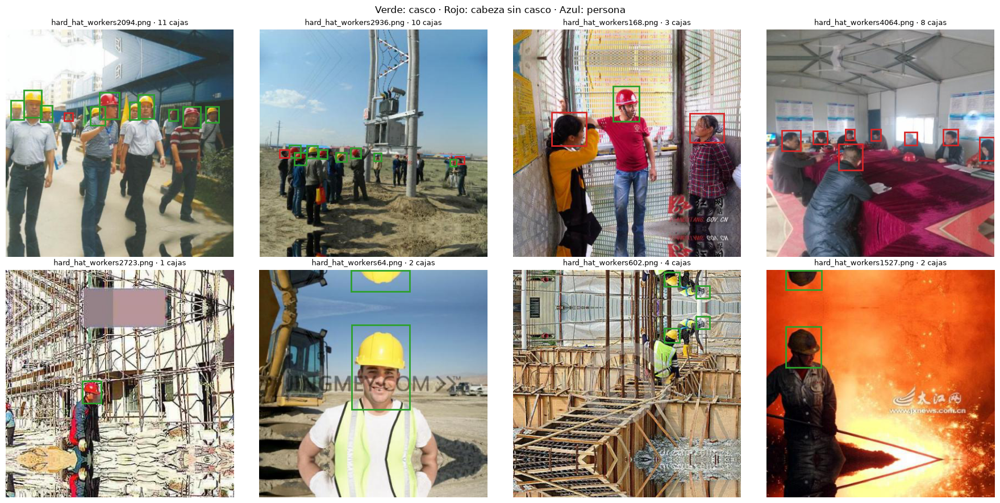

In [5]:
COLORES = ["#2ca02c", "#d62728", "#1f77b4"]
ejemplos = pd.concat([d_train[d_train.alerta].sample(4, random_state=SEED), d_train[~d_train.alerta].sample(4, random_state=SEED)])
fig, axes = plt.subplots(2, 4, figsize=(18, 9))
for ax, r in zip(axes.ravel(), ejemplos.itertuples()):
    ax.imshow(Image.open(r.ruta).convert("RGB")); ax.axis("off")
    for c, x1, y1, x2, y2 in r.cajas:
        ax.add_patch(patches.Rectangle((x1, y1), x2 - x1, y2 - y1, fill=False, lw=2, ec=COLORES[c]))
    ax.set_title(f"{r.ruta.name} · {r.n} cajas", fontsize=9)
fig.suptitle("Verde: casco · Rojo: cabeza sin casco · Azul: persona")
plt.tight_layout(); plt.savefig(FIG_DIR / "ejemplos_anotados.png", dpi=150); plt.show()

## 5. Conversión a formato YOLO
Cada imagen se guarda como JPEG RGB y cada caja como `clase x_centro y_centro ancho alto`, normalizados entre 0 y 1.

In [6]:
if YOLO_DIR.exists(): shutil.rmtree(YOLO_DIR)
for nombre, d in [("train", d_train), ("val", d_val), ("test", d_test)]:
    (YOLO_DIR / "images" / nombre).mkdir(parents=True, exist_ok=True)
    (YOLO_DIR / "labels" / nombre).mkdir(parents=True, exist_ok=True)
    for r in d.itertuples():
        stem = r.ruta.stem
        Image.open(r.ruta).convert("RGB").save(YOLO_DIR / "images" / nombre / f"{stem}.jpg", quality=95)
        with open(YOLO_DIR / "labels" / nombre / f"{stem}.txt", "w") as f:
            for c, x1, y1, x2, y2 in r.cajas:
                f.write(f"{c} {(x1+x2)/2/r.W:.6f} {(y1+y2)/2/r.H:.6f} {(x2-x1)/r.W:.6f} {(y2-y1)/r.H:.6f}\n")
DATA_YAML = YOLO_DIR / "data.yaml"
DATA_YAML.write_text(f"path: {YOLO_DIR.as_posix()}\ntrain: images/train\nval: images/val\ntest: images/test\nnames:\n"
                     + "".join(f"  {i}: {c}\n" for i, c in enumerate(CLASES)), encoding="utf-8")
print(DATA_YAML.read_text())
for s in ["train", "val", "test"]:
    print(s, len(list((YOLO_DIR / "images" / s).glob("*.jpg"))), "imágenes")

path: C:/Users/rodri/OneDrive - Universidad Iberoamericana LeÃ³n/Clases/7to Semestre/ML III/ExamenPrimerParcial/deteccion_cascos/yolo_cascos
train: images/train
val: images/val
test: images/test
names:
  0: casco
  1: cabeza_sin_casco
  2: persona

train 3500 imágenes
val 750 imágenes
test 750 imágenes


### Auditoría visual de etiquetas en formato YOLO
Se reconstruyen las cajas a partir de los `.txt` (desnormalizando las coordenadas) para verificar que la conversión es correcta antes de entrenar.

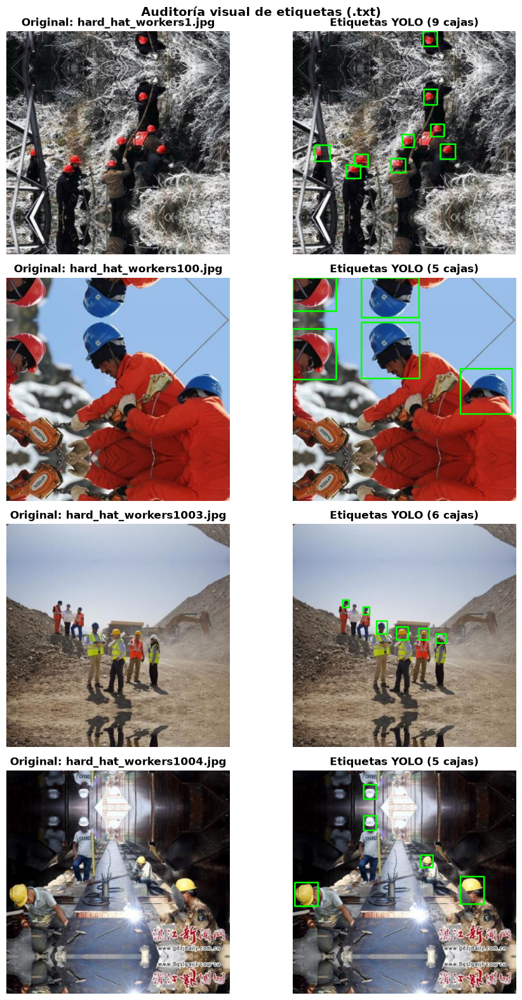

In [7]:
import cv2
PALETA = [(0, 255, 0), (255, 0, 0), (0, 0, 255)]  # casco: verde · sin casco: rojo · persona: azul

def dibujar_gt(img_path, lbl_dir):
    img = np.array(Image.open(img_path).convert("RGB")); h, w, _ = img.shape
    txt = lbl_dir / f"{Path(img_path).stem}.txt"; k = 0
    if txt.exists():
        for line in open(txt, encoding="utf-8"):
            p = line.split()
            if len(p) == 5:
                c, xc, yc, bw, bh = int(p[0]), *map(float, p[1:])
                x1, y1 = int((xc - bw/2) * w), int((yc - bh/2) * h); x2, y2 = int((xc + bw/2) * w), int((yc + bh/2) * h)
                cv2.rectangle(img, (x1, y1), (x2, y2), PALETA[c], 2); k += 1
    return img, k

muestras = sorted((YOLO_DIR / "images" / "train").glob("*.jpg"))[:4]
fig, axes = plt.subplots(len(muestras), 2, figsize=(10, 4 * len(muestras)))
for i, p in enumerate(muestras):
    axes[i, 0].imshow(Image.open(p).convert("RGB")); axes[i, 0].set_title(f"Original: {p.name}", fontweight="bold"); axes[i, 0].axis("off")
    img_gt, k = dibujar_gt(p, YOLO_DIR / "labels" / "train")
    axes[i, 1].imshow(img_gt); axes[i, 1].set_title(f"Etiquetas YOLO ({k} cajas)", fontweight="bold"); axes[i, 1].axis("off")
plt.suptitle("Auditoría visual de etiquetas (.txt)", fontsize=14, fontweight="bold")
plt.tight_layout(); plt.savefig(FIG_DIR / "auditoria_etiquetas.png", dpi=150); plt.show()

## 6. Entrenamiento: fine-tuning de YOLOv8n
YOLOv8n es la versión más pequeña de YOLOv8 (≈3 M de parámetros), preentrenada en COCO, donde ya aprendió a detectar personas. Se reemplaza la cabeza de detección por una de 3 clases y se reentrena la red completa con los datos propios. 

In [8]:
model = YOLO("yolov8n.pt")
results = model.train(
    data=str(DATA_YAML),              # Ruta al data.yaml
    epochs=CFG["epocas"],             # Épocas de ajuste fino
    imgsz=CFG["tamano_imagen"],       # Resolución de entrada
    batch=CFG["batch"],               # Tamaño de lote
    workers=CFG["workers"],
    device=device,                    # GPU NVIDIA (CUDA)
    optimizer=CFG["optimizador"],     # AdamW
    lr0=CFG["lr0"],                   # Tasa de aprendizaje inicial
    patience=CFG["paciencia_early_stopping"],
    seed=SEED,
    project=str((BASE / "runs").resolve()),
    name="yolov8n_cascos",
    exist_ok=True, pretrained=True, save=True, plots=True, verbose=True,
)
RUN_DIR = Path(model.trainer.save_dir)
BEST = RUN_DIR / "weights" / "best.pt"
print(f"\n✅ Entrenamiento completado. Pesos guardados en: {RUN_DIR}")

New https://pypi.org/project/ultralytics/8.4.162 available  Update with 'pip install -U ultralytics'
Ultralytics 8.4.155  Python-3.12.0 torch-2.14.0+cu126 CUDA:0 (NVIDIA GeForce RTX 4050 Laptop GPU, 6140MiB)
engine\trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=C:\Users\rodri\OneDrive - Universidad Iberoamericana Len\Clases\7to Semestre\ML III\ExamenPrimerParcial\deteccion_cascos\yolo_cascos\data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=64

## 7. Curvas de aprendizaje
Se muestra `results.png` generado por Ultralytics y una versión resumida con las pérdidas de entrenamiento y validación y el mAP por época.

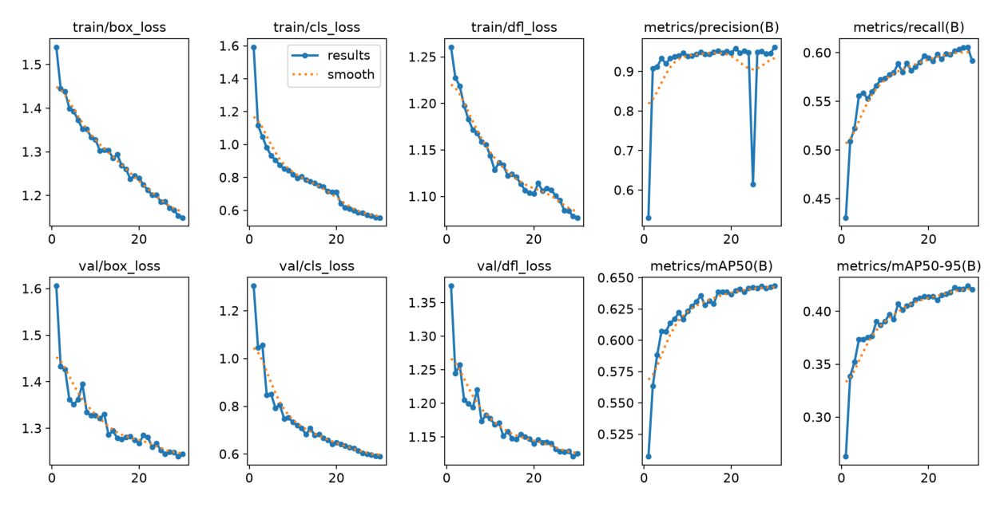

WindowsPath('figuras_deteccion/results_ultralytics.png')

In [9]:
plt.figure(figsize=(16, 8)); plt.imshow(Image.open(RUN_DIR / "results.png")); plt.axis("off"); plt.show()
shutil.copy(RUN_DIR / "results.png", FIG_DIR / "results_ultralytics.png")

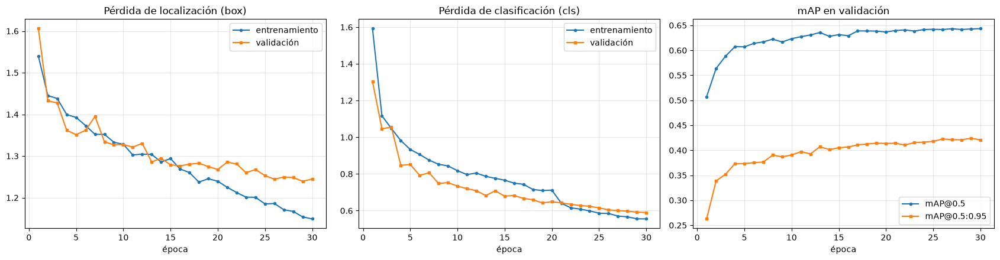

Épocas ejecutadas: 30 | mejor época: 29 -> mAP50 0.6427 | mAP50-95 0.4240


In [10]:
H = pd.read_csv(RUN_DIR / "results.csv"); H.columns = [c.strip() for c in H.columns]
fig, axes = plt.subplots(1, 3, figsize=(17, 4.5))
for ax, (k, t) in zip(axes[:2], [("box_loss", "Pérdida de localización (box)"), ("cls_loss", "Pérdida de clasificación (cls)")]):
    ax.plot(H.epoch, H[f"train/{k}"], "o-", ms=3, label="entrenamiento"); ax.plot(H.epoch, H[f"val/{k}"], "s-", ms=3, label="validación")
    ax.set_title(t); ax.set_xlabel("época"); ax.grid(alpha=0.3); ax.legend()
axes[2].plot(H.epoch, H["metrics/mAP50(B)"], "o-", ms=3, label="mAP@0.5")
axes[2].plot(H.epoch, H["metrics/mAP50-95(B)"], "s-", ms=3, label="mAP@0.5:0.95")
axes[2].set_title("mAP en validación"); axes[2].set_xlabel("época"); axes[2].grid(alpha=0.3); axes[2].legend()
plt.tight_layout(); plt.savefig(FIG_DIR / "curvas_aprendizaje.png", dpi=150); plt.show()
mejor = H.loc[H["metrics/mAP50-95(B)"].idxmax()]
print(f"Épocas ejecutadas: {len(H)} | mejor época: {int(mejor.epoch)} -> mAP50 {mejor['metrics/mAP50(B)']:.4f} | mAP50-95 {mejor['metrics/mAP50-95(B)']:.4f}")

## 8. Evaluación en el conjunto de prueba (mejor modelo)

In [11]:
best = YOLO(str(BEST))
m = best.val(data=str(DATA_YAML), split="test", imgsz=CFG["tamano_imagen"], batch=CFG["batch"], workers=CFG["workers"], device=device,
             plots=True, project=str((BASE / "runs").resolve()), name="prueba", exist_ok=True)
TEST_DIR = Path(m.save_dir)
print("\n--- MÉTRICAS EN EL CONJUNTO DE PRUEBA ---")
print(f"📊 Box mAP50:    {m.box.map50:.4f}")
print(f"📊 Box mAP50-95: {m.box.map:.4f}")
display(pd.DataFrame({"valor": {"Precisión (P)": m.box.mp, "Exhaustividad (R)": m.box.mr,
                                "mAP@0.5": m.box.map50, "mAP@0.5:0.95": m.box.map}}).round(4))
display(pd.DataFrame({"AP@0.5": [m.box.ap50[i] for i in range(len(m.box.ap_class_index))],
                      "AP@0.5:0.95": [m.box.ap[i] for i in range(len(m.box.ap_class_index))]},
                     index=[CLASES[c] for c in m.box.ap_class_index]).round(4))

Ultralytics 8.4.155  Python-3.12.0 torch-2.14.0+cu126 CUDA:0 (NVIDIA GeForce RTX 4050 Laptop GPU, 6140MiB)
Model summary (fused): 72 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs
WARNING val: Slow image access detected (ping: 0.20.0 ms, read: 7.42.4 MB/s, size: 49.5 KB). Use local storage instead of remote/mounted storage for better performance. See https://docs.ultralytics.com/guides/model-training-tips
val: Scanning C:\Users\rodri\OneDrive - Universidad Iberoamericana León\Clases\7to Semestre\ML III\ExamenPrimerParcial\deteccion_cascos\yolo_cascos\labels\test... 750 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 750/750 418.4it/s 1.8s0.1s
val: New cache created: C:\Users\rodri\OneDrive - Universidad Iberoamericana Len\Clases\7to Semestre\ML III\ExamenPrimerParcial\deteccion_cascos\yolo_cascos\labels\test.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 47/47 7.2it/s 6.6s0.1s
                   all        75

,valor
Precisión (P),0.9393
Exhaustividad (R),0.5836
mAP@0.5,0.6212
mAP@0.5:0.95,0.4083


,AP@0.5,AP@0.5:0.95
casco,0.9483,0.6242
cabeza_sin_casco,0.8946,0.5895
persona,0.0207,0.0112


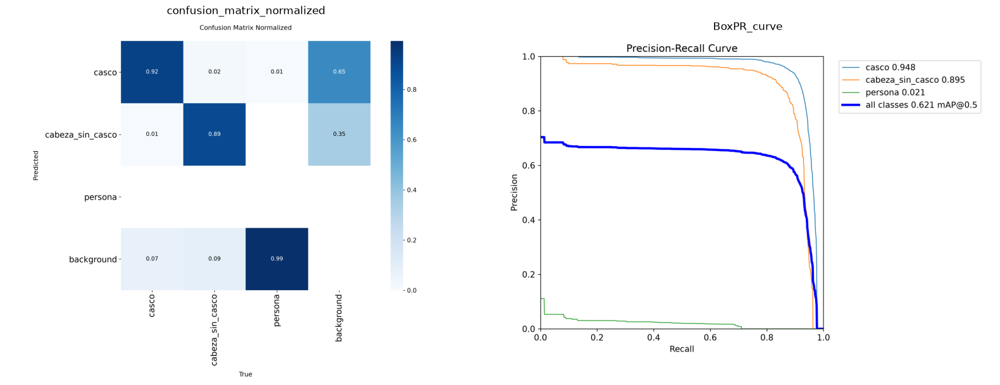

In [12]:
figs = [TEST_DIR / nm for nm in ["confusion_matrix_normalized.png", "BoxPR_curve.png", "PR_curve.png"] if (TEST_DIR / nm).exists()]
fig, axes = plt.subplots(1, len(figs), figsize=(8 * len(figs), 6))
for ax, p in zip(np.atleast_1d(axes), figs):
    ax.imshow(Image.open(p)); ax.axis("off"); ax.set_title(p.stem)
    shutil.copy(p, FIG_DIR / f"prueba_{p.name}")
plt.tight_layout(); plt.show()

## 9. Predicciones sobre el conjunto de prueba y alerta por imagen
Con umbral de confianza 0.25 e IoU 0.50 (los de la Práctica 2) se cuentan las cajas de cada clase. Una imagen genera **alerta** si se detecta al menos una cabeza sin casco; se compara contra la alerta real según las anotaciones.

Imágenes de prueba: 750
Alerta correcta en 96.5% de las imágenes | alertas reales detectadas: 127/138 | falsas alarmas: 15
Error absoluto medio por imagen -> cascos: 0.54 | sin casco: 0.25


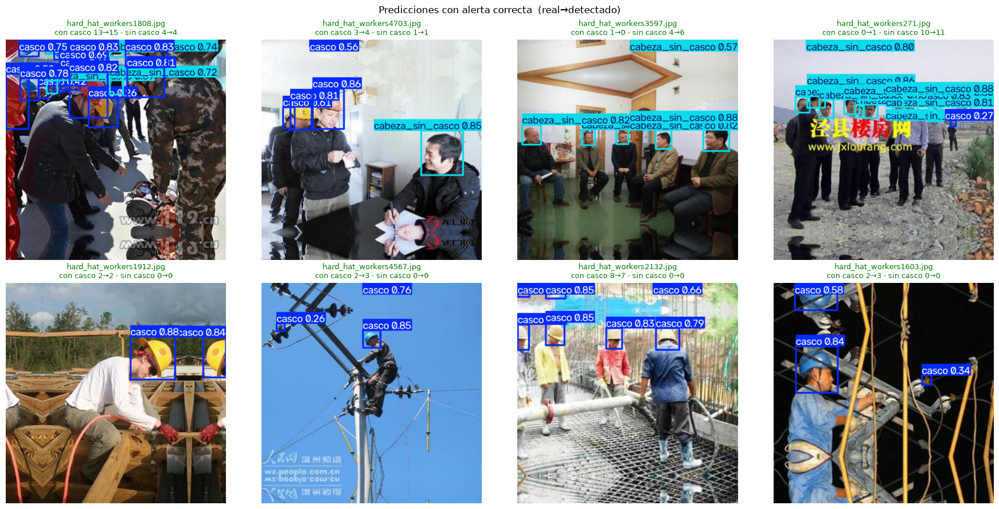

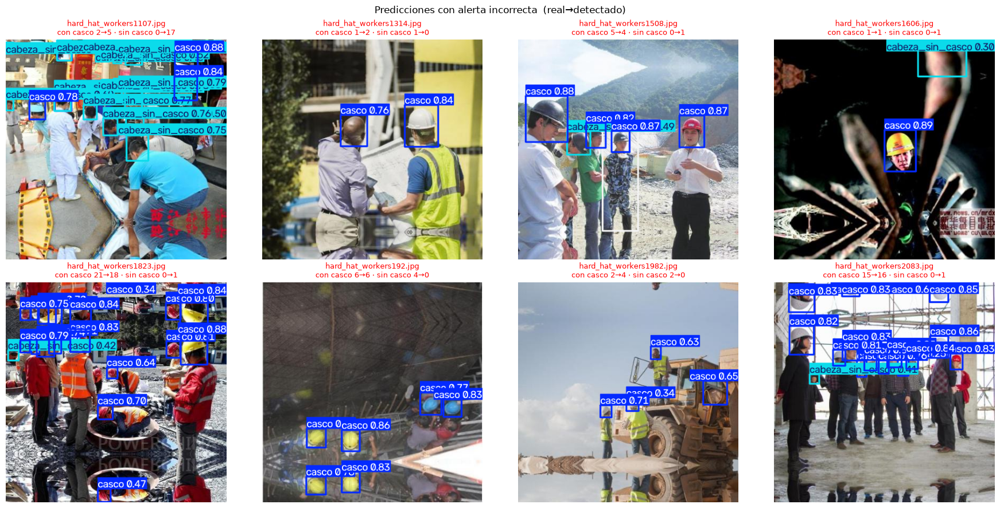

,imagen,casco_real,casco_pred,sin_casco_real,sin_casco_pred,alerta_real,alerta_pred,alerta_ok
18,hard_hat_workers1107.jpg,2,5,0,17,False,True,False
49,hard_hat_workers1314.jpg,1,2,1,0,True,False,False
87,hard_hat_workers1508.jpg,5,4,0,1,False,True,False
102,hard_hat_workers1606.jpg,1,1,0,1,False,True,False
129,hard_hat_workers1823.jpg,21,18,0,1,False,True,False
146,hard_hat_workers192.jpg,6,6,4,0,True,False,False
158,hard_hat_workers1982.jpg,2,4,2,0,True,False,False
168,hard_hat_workers2083.jpg,15,16,0,1,False,True,False
181,hard_hat_workers2171.jpg,1,1,0,8,False,True,False
186,hard_hat_workers2181.jpg,1,1,2,0,True,False,False


In [13]:
filas = []
for p in sorted((YOLO_DIR / "images" / "test").glob("*.jpg")):
    r = best.predict(source=str(p), conf=CFG["umbral_confianza_prediccion"], iou=CFG["umbral_iou_nms"], imgsz=CFG["tamano_imagen"], verbose=False)[0]
    pred = np.bincount(r.boxes.cls.cpu().numpy().astype(int), minlength=3)
    real = np.bincount(np.loadtxt(YOLO_DIR / "labels" / "test" / f"{p.stem}.txt", ndmin=2)[:, 0].astype(int), minlength=3)
    filas.append(dict(imagen=p.name, casco_real=real[0], casco_pred=pred[0], sin_casco_real=real[1], sin_casco_pred=pred[1],
                      alerta_real=real[1] > 0, alerta_pred=pred[1] > 0, res=r))
C = pd.DataFrame(filas)
C["alerta_ok"] = C.alerta_real == C.alerta_pred
vp = (C.alerta_real & C.alerta_pred).sum(); fn = (C.alerta_real & ~C.alerta_pred).sum(); fp = (~C.alerta_real & C.alerta_pred).sum()
print(f"Imágenes de prueba: {len(C)}")
print(f"Alerta correcta en {C.alerta_ok.mean():.1%} de las imágenes | alertas reales detectadas: {vp}/{vp+fn} | falsas alarmas: {fp}")
print(f"Error absoluto medio por imagen -> cascos: {(C.casco_pred - C.casco_real).abs().mean():.2f} | sin casco: {(C.sin_casco_pred - C.sin_casco_real).abs().mean():.2f}")

def rejilla(sub, titulo, archivo):
    sub = sub.head(8)
    if len(sub) == 0: print("Sin ejemplos:", titulo); return
    fig, axes = plt.subplots(2, 4, figsize=(18, 9))
    for ax in axes.ravel(): ax.axis("off")
    for ax, f in zip(axes.ravel(), sub.itertuples()):
        ax.imshow(f.res.plot(line_width=2)[:, :, ::-1])
        ax.set_title(f"{f.imagen}\ncon casco {f.casco_real}→{f.casco_pred} · sin casco {f.sin_casco_real}→{f.sin_casco_pred}",
                     fontsize=9, color="green" if f.alerta_ok else "red")
    fig.suptitle(titulo + "  (real→detectado)"); plt.tight_layout(); plt.savefig(FIG_DIR / archivo, dpi=150); plt.show()

con_ok = C[C.alerta_real & C.alerta_ok]; sin_ok = C[~C.alerta_real & C.alerta_ok]
rejilla(pd.concat([con_ok.sample(min(4, len(con_ok)), random_state=SEED), sin_ok.sample(min(4, len(sin_ok)), random_state=SEED)]),
        "Predicciones con alerta correcta", "predicciones_correctas.png")
rejilla(C[~C.alerta_ok], "Predicciones con alerta incorrecta", "predicciones_incorrectas.png")
C.drop(columns="res")[~C.alerta_ok]

### Auditoría tripartita en el conjunto de prueba: Original · Ground Truth · Predicción

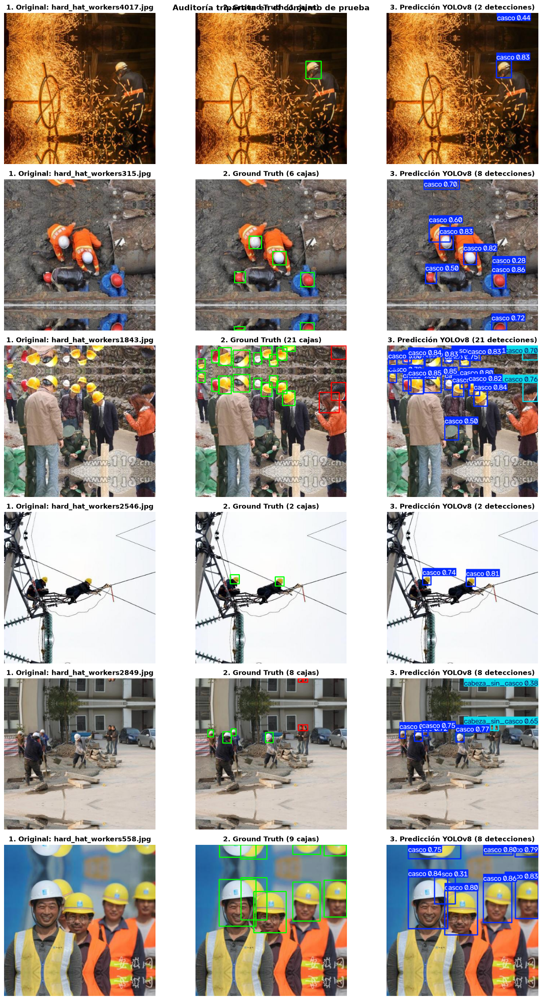

In [14]:
muestras = C.sample(6, random_state=SEED)
fig, axes = plt.subplots(len(muestras), 3, figsize=(15, 4.2 * len(muestras)))
for i, f in enumerate(muestras.itertuples()):
    p = YOLO_DIR / "images" / "test" / f.imagen
    axes[i, 0].imshow(Image.open(p).convert("RGB")); axes[i, 0].set_title(f"1. Original: {f.imagen}", fontweight="bold")
    img_gt, k = dibujar_gt(p, YOLO_DIR / "labels" / "test")
    axes[i, 1].imshow(img_gt); axes[i, 1].set_title(f"2. Ground Truth ({k} cajas)", fontweight="bold")
    axes[i, 2].imshow(cv2.cvtColor(f.res.plot(line_width=2), cv2.COLOR_BGR2RGB))
    axes[i, 2].set_title(f"3. Predicción YOLOv8 ({len(f.res)} detecciones)", fontweight="bold")
    for a in axes[i]: a.axis("off")
plt.suptitle("Auditoría tripartita en el conjunto de prueba", fontsize=14, fontweight="bold")
plt.tight_layout(); plt.savefig(FIG_DIR / "auditoria_tripartita.png", dpi=150); plt.show()

In [15]:
shutil.copy(BEST, "detector_cascos_yolov8n.pt")
print("Modelo guardado. Tamaño:", round(os.path.getsize("detector_cascos_yolov8n.pt") / 1e6, 2), "MB")

Modelo guardado. Tamaño: 6.27 MB
